<a href="https://colab.research.google.com/github/zahra-sharifzadeh/100daysPythonBootcamp/blob/main/Aras_Paydar__financial_data_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


  <div style="text-align:center;">
        <img src="https://thumb2.jobinjacdn.com/iXN89x4FFiw-V_nEg-6RH-FXM1I=/fit-in/128x128/filters:strip_exif():fill(transparent):quality(100)/https://mstorage2.jobinjacdn.com/other/files/uploads/images/e15e3c02-c9fc-4894-b411-33f8fd3a83d3/main.png"
 width="10%" />
  </div>

<div class="alert alert-block alert-success">
  <h1 >Aras Paydar financial data processing</h1>
  <h3 >Zahra Sharifzadeh</h3>
</div>



---


# Project Description
## Train different Models
* train models (at least "XGBoost" and "Random Forset" and "Decision
Tree").

    - you can add any other model you prefer to list.

## Hyperparameter tuning
* add measures to increase test results by using different loss functions, adding weights, ... .

## Feature selection

* add measures to reduce number of features such as regularizations, ...

   - implement various feature importance metrics (such as `shapley` ...)




## Output that needs to be reported:

* explain results.

* visualize results.

* group results by quantile-based descretization of prediction to five groups per day then visualize return value of each group.




**Attention**:
every row is one data input and columns are features


---



# Train On Dataset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X_train = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/X_Train.parquet').set_index('symbol', append=True).sort_index()
X_test = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/X_Test.parquet').set_index('symbol', append=True).sort_index()
y_train = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/y_Train.parquet').set_index('symbol', append=True).sort_index()['ret_abs_1_days']
y_test = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/y_Test.parquet').set_index('symbol', append=True).sort_index()['ret_abs_1_days']

## Explore data
Exploring the data to understand its structure and key insights.

## quick verifying data

In [ ]:
X_train.head() # Chencking train data

,,status,long_peak3,long_peak2,long_peak1,sorted_long_peak1,sorted_long_peak2,sorted_long_peak3,long_valy3,long_valy2,long_valy1,...,sales_growth_total,sales_growth_same_sector,gross_growth_total,gross_growth_same_sector,oprtng_growth_total,oprtng_growth_same_sector,net_growth_total,net_growth_same_sector,num_report_total,num_report_same_sector
date,symbol,,,,,,,,,,,,,,,,,,,,,
2010-08-11,سدور,0.0,0.646422,0.278810,0.092937,0.362250,0.203123,0.278810,-0.286245,-0.135316,-0.211896,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
2010-08-25,سدور,0.0,0.588100,0.283774,0.097179,0.313995,0.207792,0.283774,-0.283475,-0.131960,-0.208837,...,-0.032785,0.0,2.074595,0.0,-0.222118,0.0,1.702358,0.0,2.0,0.0
2010-08-28,سدور,0.0,0.511800,0.264706,0.080882,0.250863,0.189853,0.264706,-0.294118,-0.144853,-0.220588,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
2010-08-29,سدور,0.0,0.523163,0.283582,0.097015,0.260266,0.207612,0.283582,-0.283582,-0.132090,-0.208955,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
2010-08-30,سدور,0.0,0.186364,0.260997,0.077713,0.077713,0.186364,0.260997,-0.296188,-0.147361,-0.222874,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0


In [ ]:
X_train.tail() # Chencking train data

status  long_peak3  long_peak2  long_peak1  \
date       symbol                                                 
2022-09-04 کپرور        0.0    0.773025    0.590294    0.361740   
           کپشیر        0.0    0.533323    2.063809    0.097372   
           کگاز         0.0    0.676979    0.333288    0.262089   
           کی بی سی     0.0    1.279346    0.630170    0.364583   
           گکوثر        0.0    2.759494    0.650000    0.436709   

                     sorted_long_peak1  sorted_long_peak2  sorted_long_peak3  \
date       symbol                                                              
2022-09-04 کپرور              0.361740           0.590294           0.773025   
           کپشیر              0.097372           0.533323           2.063809   
           کگاز               0.262089           0.333288           0.676979   
           کی بی سی           0.364583           0.630170           1.279346   
           گکوثر              0.436709           0.650000           2.759494   

                     long_valy3  long_valy2  long_valy1  ...  \
date       symbol                                        ...   
2022-09-04 کپرور       0.331444   -0.097140   -0.119277  ...   
           کپشیر      -0.535011    0.077415   -0.430494  ...   
           کگاز        0.049562    0.065731   -0.219813  ...   
           کی بی سی    0.075867   -0.196983   -0.194792  ...   
           گکوثر       0.187975    0.149367   -0.250633  ...   

                     sales_growth_total  sales_growth_same_sector  \
date       symbol                                                   
2022-09-04 کپرور                    0.0                       0.0   
           کپشیر                    0.0                       0.0   
           کگاز                     0.0                       0.0   
           کی بی سی                 0.0                       0.0   
           گکوثر                    0.0                       0.0   

                     gross_growth_total  gross_growth_same_sector  \
date       symbol                                                   
2022-09-04 کپرور                    0.0                       0.0   
           کپشیر                    0.0                       0.0   
           کگاز                     0.0                       0.0   
           کی بی سی                 0.0                       0.0   
           گکوثر                    0.0                       0.0   

                     oprtng_growth_total  oprtng_growth_same_sector  \
date       symbol                                                     
2022-09-04 کپرور                     0.0                        0.0   
           کپشیر                     0.0                        0.0   
           کگاز                      0.0                        0.0   
           کی بی سی                  0.0                        0.0   
           گکوثر                     0.0                        0.0   

                     net_growth_total  net_growth_same_sector  \
date       symbol                                               
2022-09-04 کپرور                  0.0                     0.0   
           کپشیر                  0.0                     0.0   
           کگاز                   0.0                     0.0   
           کی بی سی               0.0                     0.0   
           گکوثر                  0.0                     0.0   

                     num_report_total  num_report_same_sector  
date       symbol                                              
2022-09-04 کپرور                  0.0                     0.0  
           کپشیر                  0.0                     0.0  
           کگاز                   0.0                     0.0  
           کی بی سی               0.0                     0.0  
           گکوثر                  0.0                     0.0  

[5 rows x 261 columns]

In [ ]:
y_train.head() # checking 5 first rows of y_train

,,ret_abs_1_days
date,symbol,
2010-08-11,سدور,-0.031078
2010-08-25,سدور,0.015077
2010-08-28,سدور,-0.014706
2010-08-29,سدور,0.017910
2010-08-30,سدور,-0.003079


In [ ]:
y_train.tail() # checking 5 last rows of y_train

date        symbol  
2022-09-04  کپرور       0.035366
            کپشیر       0.000773
            کگاز        0.012840
            کی بی سی   -0.009375
            گکوثر      -0.009494
Name: ret_abs_1_days, dtype: float64

In [ ]:
X_test.head() # Checking 5 first rows of X_test

status  long_peak3  long_peak2  long_peak1  \
date       symbol                                               
2022-09-05 آپ         0.0    0.824024    1.452511    1.035599   
           اخابر      0.0    1.159448    0.568964    0.167725   
           ارفع       0.0    0.145547    0.522620    0.274579   
           افرا       0.0    0.525132    0.241114    1.018700   
           اوان       0.0    1.581188   -0.011252    0.122207   

                   sorted_long_peak1  sorted_long_peak2  sorted_long_peak3  \
date       symbol                                                            
2022-09-05 آپ               0.824024           1.035599           1.452511   
           اخابر            0.167725           0.568964           1.159448   
           ارفع             0.145547           0.274579           0.522620   
           افرا             0.241114           0.525132           1.018700   
           اوان            -0.011252           0.122207           1.581188   

                   long_valy3  long_valy2  long_valy1  ...  \
date       symbol                                      ...   
2022-09-05 آپ        0.001342    0.384267   -0.108313  ...   
           اخابر     0.325842   -0.110876   -0.156199  ...   
           ارفع     -0.207187   -0.280623   -0.107874  ...   
           افرا      0.130568   -0.287611   -0.177066  ...   
           اوان     -0.227453   -0.268569   -0.318259  ...   

                   sales_growth_total  sales_growth_same_sector  \
date       symbol                                                 
2022-09-05 آپ                     0.0                       0.0   
           اخابر                  0.0                       0.0   
           ارفع                   0.0                       0.0   
           افرا                   0.0                       0.0   
           اوان                   0.0                       0.0   

                   gross_growth_total  gross_growth_same_sector  \
date       symbol                                                 
2022-09-05 آپ                     0.0                       0.0   
           اخابر                  0.0                       0.0   
           ارفع                   0.0                       0.0   
           افرا                   0.0                       0.0   
           اوان                   0.0                       0.0   

                   oprtng_growth_total  oprtng_growth_same_sector  \
date       symbol                                                   
2022-09-05 آپ                      0.0                        0.0   
           اخابر                   0.0                        0.0   
           ارفع                    0.0                        0.0   
           افرا                    0.0                        0.0   
           اوان                    0.0                        0.0   

                   net_growth_total  net_growth_same_sector  num_report_total  \
date       symbol                                                               
2022-09-05 آپ                   0.0                     0.0               0.0   
           اخابر                0.0                     0.0               0.0   
           ارفع                 0.0                     0.0               0.0   
           افرا                 0.0                     0.0               0.0   
           اوان                 0.0                     0.0               0.0   

                   num_report_same_sector  
date       symbol                          
2022-09-05 آپ                         0.0  
           اخابر                      0.0  
           ارفع                       0.0  
           افرا                       0.0  
           اوان                       0.0  

[5 rows x 261 columns]

In [ ]:
y_test.head() # Checking 5 first rows of y_test

date        symbol
2022-09-05  آپ        0.026786
            اخابر    -0.032389
            ارفع     -0.011149
            افرا      0.057644
            اوان      0.063993
Name: ret_abs_1_days, dtype: float64

In [ ]:
y_test.tail()

date        symbol  
2024-05-28  کلر         0.019753
            کمرجان      0.022556
            کهمدا       0.019862
            کی بی سی   -0.017699
            گکوثر       0.019296
Name: ret_abs_1_days, dtype: float64

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 315823 entries, (Timestamp('2010-08-11 00:00:00'), 'سدور') to (Timestamp('2022-09-04 00:00:00'), 'گکوثر')
Columns: 261 entries, status to num_report_same_sector
dtypes: float64(258), int64(3)
memory usage: 630.2+ MB


In [ ]:
y_train.info()

<class 'pandas.core.series.Series'>
MultiIndex: 315823 entries, (Timestamp('2010-08-11 00:00:00'), 'سدور') to (Timestamp('2022-09-04 00:00:00'), 'گکوثر')
Series name: ret_abs_1_days
Non-Null Count   Dtype  
--------------   -----  
315823 non-null  float64
dtypes: float64(1)
memory usage: 3.7+ MB


In [ ]:
print(X_train.columns) # print column names

Index(['status', 'long_peak3', 'long_peak2', 'long_peak1', 'sorted_long_peak1',
       'sorted_long_peak2', 'sorted_long_peak3', 'long_valy3', 'long_valy2',
       'long_valy1',
       ...
       'sales_growth_total', 'sales_growth_same_sector', 'gross_growth_total',
       'gross_growth_same_sector', 'oprtng_growth_total',
       'oprtng_growth_same_sector', 'net_growth_total',
       'net_growth_same_sector', 'num_report_total', 'num_report_same_sector'],
      dtype='object', length=261)


In [ ]:
# Save column names in columns.txt file to check some of these features
# Get column names
columns = X_train.columns.tolist()

# Write column names to a file ('address/columns.txt')
with open('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/columns.txt', 'w') as f:
    for col in columns:
        f.write(col + '\n')

In [ ]:
df_reset = X_train.reset_index()  # Reset index to work with columns


In [ ]:
X_train.reset_index().head()

,date,symbol,status,long_peak3,long_peak2,long_peak1,sorted_long_peak1,sorted_long_peak2,sorted_long_peak3,long_valy3,...,sales_growth_total,sales_growth_same_sector,gross_growth_total,gross_growth_same_sector,oprtng_growth_total,oprtng_growth_same_sector,net_growth_total,net_growth_same_sector,num_report_total,num_report_same_sector
0,2010-08-11,سدور,0.0,0.646422,0.278810,0.092937,0.362250,0.203123,0.278810,-0.286245,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
1,2010-08-25,سدور,0.0,0.588100,0.283774,0.097179,0.313995,0.207792,0.283774,-0.283475,...,-0.032785,0.0,2.074595,0.0,-0.222118,0.0,1.702358,0.0,2.0,0.0
2,2010-08-28,سدور,0.0,0.511800,0.264706,0.080882,0.250863,0.189853,0.264706,-0.294118,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
3,2010-08-29,سدور,0.0,0.523163,0.283582,0.097015,0.260266,0.207612,0.283582,-0.283582,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
4,2010-08-30,سدور,0.0,0.186364,0.260997,0.077713,0.077713,0.186364,0.260997,-0.296188,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0


In [ ]:
# Checking information of data
X_train.reset_index().info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315823 entries, 0 to 315822
Data columns (total 263 columns):
 #    Column                                                  Dtype         
---   ------                                                  -----         
 0    date                                                    datetime64[ns]
 1    symbol                                                  object        
 2    status                                                  float64       
 3    long_peak3                                              float64       
 4    long_peak2                                              float64       
 5    long_peak1                                              float64       
 6    sorted_long_peak1                                       float64       
 7    sorted_long_peak2                                       float64       
 8    sorted_long_peak3                                       float64       
 9    long_valy3                         

## numeric and non numeric columns

In [ ]:
# Identify numeric columns
numeric_columns = df_reset.select_dtypes(include=['number']).columns.tolist()

# Identify non-numeric columns
non_numeric_columns = df_reset.select_dtypes(exclude=['number']).columns.tolist()

print("Numeric Columns:", numeric_columns)
print("Non-Numeric Columns:", non_numeric_columns)

Numeric Columns: ['status', 'long_peak3', 'long_peak2', 'long_peak1', 'sorted_long_peak1', 'sorted_long_peak2', 'sorted_long_peak3', 'long_valy3', 'long_valy2', 'long_valy1', 'sorted_long_valy1', 'sorted_long_valy2', 'sorted_long_valy3', 'peak4', 'peak3', 'peak2', 'peak1', 'sorted_peak1', 'sorted_peak2', 'sorted_peak3', 'sorted_peak4', 'valy4', 'valy3', 'valy2', 'valy1', 'sorted_valy1', 'sorted_valy2', 'sorted_valy3', 'sorted_valy4', 'slope8', 'slope7', 'slope6', 'slope5', 'slope4', 'slope3', 'slope2', 'slope1', 'dfpiv8', 'dfpiv7', 'dfpiv6', 'dfpiv5', 'dfpiv4', 'dfpiv3', 'dfpiv2', 'dfpiv1', 'dff8', 'dff7', 'dff6', 'dff5', 'dff4', 'dff3', 'dff2', 'dff1', 'return_close', 'diff_close_vwap', 'open_return', 'during_ret_close', 'up_shadow', 'down_shadow', 'rizesh_w', 'khizesh_w', 'return_w', 'profit_w', 'std_week', 'fluctuation_w', 'rizesh_m', 'khizesh_m', 'return_m', 'profit_m', 'profit_w_m', 'fluctuation_m', 'std_month', 'rizesh_y', 'khizesh_y', 'return_y', 'profit_y', 'profit_m_y', 'money

## Summary Statistics

In [ ]:
# Get summary statistics of X_train
X_train.describe()

,status,long_peak3,long_peak2,long_peak1,sorted_long_peak1,sorted_long_peak2,sorted_long_peak3,long_valy3,long_valy2,long_valy1,...,sales_growth_total,sales_growth_same_sector,gross_growth_total,gross_growth_same_sector,oprtng_growth_total,oprtng_growth_same_sector,net_growth_total,net_growth_same_sector,num_report_total,num_report_same_sector
count,315823.0,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,...,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000,315823.000000
mean,0.0,0.414730,0.421543,0.336780,-0.203974,0.186266,1.191202,-0.443400,-0.360926,-0.309442,...,4.820951,0.309188,7.212689,2.271021,1.456145,0.132932,1.916085,0.527373,3.259753,0.179300
std,0.0,7.136061,5.048646,1.600839,1.248451,1.608471,8.590488,1.049346,0.882830,0.421069,...,115.401821,58.304581,348.583015,513.468938,25.830941,7.327245,30.108660,91.899735,11.946187,0.866222
min,0.0,-0.988771,-0.981393,-0.965911,-0.989237,-0.981928,-0.959376,-0.995665,-0.990743,-0.984251,...,-1.378339,-4.183325,-135.574078,-232.651545,-200.730375,-200.730375,-186.626298,-397.388816,0.000000,0.000000
25%,0.0,-0.696403,-0.460915,0.018705,-0.711239,-0.431192,0.108065,-0.857792,-0.745785,-0.519065,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0,-0.225950,0.063952,0.235826,-0.312203,0.088710,0.427055,-0.641046,-0.462631,-0.284689,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,0.0,0.456382,0.596180,0.487766,0.132072,0.454807,1.008811,-0.283958,-0.153340,-0.128124,...,0.215023,0.000000,0.375031,0.000000,0.462271,0.000000,0.633180,0.000000,3.000000,0.000000
max,0.0,237.308519,294.066945,101.528818,64.316316,65.374296,294.066945,44.660170,38.358322,40.966522,...,3745.872761,22475.760417,18429.421993,129006.000000,1123.893204,1271.535960,1016.856409,29471.000000,245.000000,26.000000


In [ ]:
# Get summary statistics of y_train
y_train.describe()

,ret_abs_1_days
count,315823.000000
mean,0.002273
std,0.029976
min,-0.167293
25%,-0.018344
50%,-0.000019
75%,0.023271
max,0.369704


## Checking company names and dates

In [ ]:
# Get unique company names from the index (level 'Company')
company_names = X_train.index.get_level_values('symbol').unique()

# Print the unique company names
print(company_names)
print("Number of companies: ",len(company_names))

Index(['سدور', 'خمهر', 'لسرما', 'کمرجان', 'کخاک', 'کاما', 'خچرخش', 'فولاد',
       'فباهنر', 'فخاس',
       ...
       'همراه', 'درهآور', 'پاکشو', 'غنوش', 'رنیک', 'غصینو', 'کلر', 'گدنا',
       'رافزا', 'نطرین'],
      dtype='object', name='symbol', length=272)
Number of companies:  272


In [ ]:
# Get unique date from the index (level 'Company')
days = X_train.index.get_level_values('date').unique()

# Print the unique date
print(days)
print("Number of days: ",len(days))
print(min(days))
print(max(days))

DatetimeIndex(['2010-08-11', '2010-08-25', '2010-08-28', '2010-08-29',
               '2010-08-30', '2010-08-31', '2010-09-04', '2010-09-05',
               '2010-09-06', '2010-09-07',
               ...
               '2022-08-22', '2022-08-23', '2022-08-24', '2022-08-27',
               '2022-08-28', '2022-08-29', '2022-08-30', '2022-08-31',
               '2022-09-03', '2022-09-04'],
              dtype='datetime64[ns]', name='date', length=2793, freq=None)
Number of days:  2793
2010-08-11 00:00:00
2022-09-04 00:00:00


In [ ]:
# Get unique company names from the index (level 'Company')
company_names_test = X_test.index.get_level_values('symbol').unique()

# Print the unique company names
print(company_names_test)
print("Number of companies: ",len(company_names_test))

Index(['آپ', 'اخابر', 'ارفع', 'افرا', 'اوان', 'اپرداز', 'بالبر', 'بترانس',
       'بسویچ', 'بشهاب',
       ...
       'چکاوه', 'فروس', 'چکارن', 'کمنگنز', 'کنور', 'کچاد', 'قاسم', 'پخش',
       'رنیک', 'فاراک'],
      dtype='object', name='symbol', length=272)
Number of companies:  272


In [ ]:
# Get unique date from the index (level 'Company')
days_test = X_test.index.get_level_values('date').unique()

# Print the unique date
print(days_test)
print("Number of days: ",len(days_test))
print(min(days_test))
print(max(days_test))

DatetimeIndex(['2022-09-05', '2022-09-06', '2022-09-07', '2022-09-10',
               '2022-09-11', '2022-09-12', '2022-09-13', '2022-09-14',
               '2022-09-18', '2022-09-19',
               ...
               '2024-05-11', '2024-05-12', '2024-05-13', '2024-05-14',
               '2024-05-15', '2024-05-18', '2024-05-19', '2024-05-25',
               '2024-05-26', '2024-05-28'],
              dtype='datetime64[ns]', name='date', length=392, freq=None)
Number of days:  392
2022-09-05 00:00:00
2024-05-28 00:00:00


## Saving data by comapy names

Data is organized by company names for ease of access. These files can be utilized for advanced data analysis and building more complex models.

In [ ]:
address = '/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/data_by_company_names/'
for name in company_names:
  company_data = X_train.xs(key=name, level='symbol')

  path_to_save = address + name +'.csv'
  company_data.to_csv(path_to_save, index=False)


## Plot histogram by company name and features

Plotting histograms for different companies and features in your dataset is a vital part of Exploratory Data Analysis (EDA) for several reasons:

1. Understanding Distribution: Histograms provide a visual representation of the distribution of a particular feature.

2. The shape of the histogram can reveal if the data is normally distributed
3. Detecting Outliers: Histograms help pinpoint outliers within your data.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_histograms_seaborn(stock_data, company_names, feature_names, rows, cols):
    """
    Plots histograms for specified features of given company names using Seaborn.

    Parameters:
    - stock_data: DataFrame containing stock data with a MultiIndex (levels include 'symbol').
    - company_names: List of company names (symbols).
    - feature_names: List of feature names to be plotted.
    - rows: Number of rows for subplots.
    - cols: Number of columns for subplots.
    """

    # Create a figure with specified rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))

    # Flatten the axes array for easier indexing
    axes = axes.flatten()

    index = 0  # Counter for subplot index

    # Loop through each company and feature
    for company in company_names:
        for feature in feature_names:
            # Filter the data for the specific stock symbol
            feature_data = stock_data.xs(key=company, level='symbol')[feature]

            # Use Seaborn to plot histogram
            sns.histplot(feature_data, bins=50, kde=True, ax=axes[index], color='blue', edgecolor='black')
            axes[index].set_title(f'Histogram of {feature} for {company}')
            axes[index].set_xlabel(feature)
            axes[index].set_ylabel('Frequency')
            axes[index].grid(True)

            index += 1

            # Stop if we've reached the number of subplots needed
            if index >= rows * cols:
                break
        if index >= rows * cols:
            break

    # Adjust layout
    plt.tight_layout()
    plt.show()




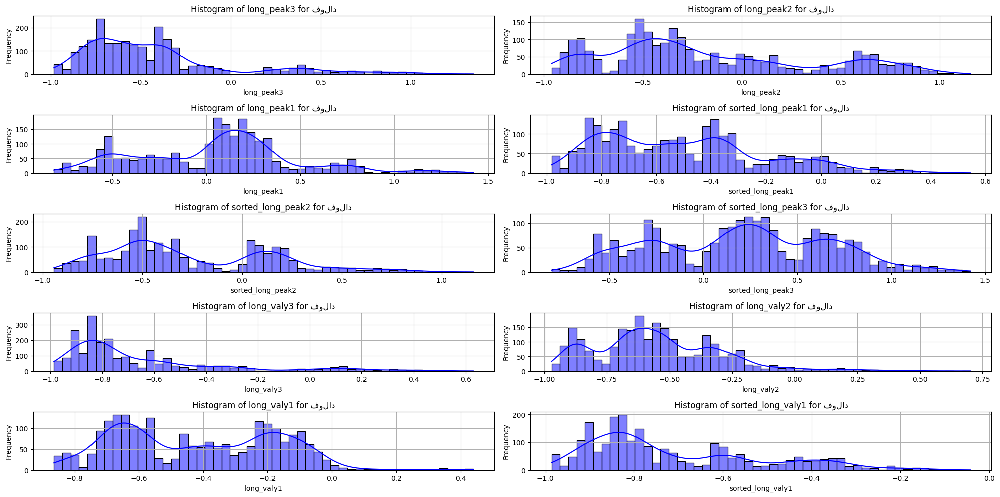

In [ ]:
company_list = ['فولاد']
feature_list = columns[1:11]
plot_histograms_seaborn(X_train, company_list, feature_list, rows=5, cols=2)

## Missing values

In [ ]:
def find_missing_value(X):
  # Checking X that have missing values
  print(X.isna().sum()[X.isna().sum() > 0])

In [ ]:
# Checking missing values

find_missing_value(X_train)
find_missing_value(y_train)
find_missing_value(X_test)
find_missing_value(y_test)



Series([], dtype: int64)
[]
Series([], dtype: int64)
[]


## Checking correlation between features

In [ ]:
correlation_matrix = X_train.drop('status', axis=1).corr()  # By default, this calculates Pearson correlation
correlation_matrix

,long_peak3,long_peak2,long_peak1,sorted_long_peak1,sorted_long_peak2,sorted_long_peak3,long_valy3,long_valy2,long_valy1,sorted_long_valy1,...,sales_growth_total,sales_growth_same_sector,gross_growth_total,gross_growth_same_sector,oprtng_growth_total,oprtng_growth_same_sector,net_growth_total,net_growth_same_sector,num_report_total,num_report_same_sector
long_peak3,1.000000,0.140957,0.130993,0.205777,0.229251,0.865104,0.328506,0.195434,0.098865,0.128690,...,0.003616,-0.000176,0.004589,-0.000369,0.005682,-0.000812,-0.000208,-0.000720,0.000422,-0.007138
long_peak2,0.140957,1.000000,0.215435,0.283742,0.642731,0.583348,0.599832,0.298708,0.162625,0.165578,...,0.003258,0.000054,0.002376,-0.000317,-0.001061,-0.000625,0.002984,-0.000805,0.000717,-0.004829
long_peak1,0.130993,0.215435,1.000000,0.745734,0.634798,0.194510,0.518343,0.714922,0.350409,0.298146,...,0.002249,0.000414,-0.001407,-0.000225,-0.000204,-0.000032,-0.003198,-0.000830,-0.001501,-0.002924
sorted_long_peak1,0.205777,0.283742,0.745734,1.000000,0.806819,0.180235,0.732005,0.924488,0.421806,0.509763,...,0.009529,0.000922,0.000873,-0.000454,0.002071,-0.000277,-0.000721,-0.001612,0.001423,-0.001143
sorted_long_peak2,0.229251,0.642731,0.634798,0.806819,1.000000,0.381941,0.880384,0.823511,0.413123,0.418389,...,0.007649,0.000312,0.000168,-0.000434,0.001196,-0.000707,0.000586,-0.001993,0.001106,-0.003380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oprtng_growth_same_sector,-0.000812,-0.000625,-0.000032,-0.000277,-0.000707,-0.000874,-0.000816,-0.000779,0.001953,-0.000051,...,0.004773,0.024165,0.001862,0.006747,0.166361,1.000000,0.007512,0.005672,0.015505,0.027492
net_growth_total,-0.000208,0.002984,-0.003198,-0.000721,0.000586,0.000982,0.001927,-0.000668,-0.005555,-0.001582,...,0.005951,0.000516,-0.000431,-0.000205,0.028958,0.007512,1.000000,0.127182,0.032947,0.035467
net_growth_same_sector,-0.000720,-0.000805,-0.000830,-0.001612,-0.001993,-0.000618,-0.001502,-0.001776,-0.001846,-0.002338,...,-0.000073,0.001495,-0.000054,0.000068,0.000518,0.005672,0.127182,1.000000,0.007594,0.006839
num_report_total,0.000422,0.000717,-0.001501,0.001423,0.001106,0.000081,0.002087,0.002325,-0.000609,0.005504,...,0.010875,0.009037,0.006610,0.001809,0.000463,0.015505,0.032947,0.007594,1.000000,0.745416


In [ ]:
correlation_matrix.describe()

,long_peak3,long_peak2,long_peak1,sorted_long_peak1,sorted_long_peak2,sorted_long_peak3,long_valy3,long_valy2,long_valy1,sorted_long_valy1,...,sales_growth_total,sales_growth_same_sector,gross_growth_total,gross_growth_same_sector,oprtng_growth_total,oprtng_growth_same_sector,net_growth_total,net_growth_same_sector,num_report_total,num_report_same_sector
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000
mean,0.012614,0.014287,0.020146,0.025098,0.021926,0.014875,0.027281,0.024465,-0.004376,0.009043,...,0.005934,0.004710,0.003533,0.004607,0.004731,0.005492,0.003568,0.004574,0.005699,0.005218
std,0.094640,0.107314,0.150016,0.161131,0.166294,0.106306,0.153972,0.160555,0.162344,0.144048,...,0.062436,0.062219,0.063615,0.063368,0.063086,0.062876,0.062884,0.062497,0.078908,0.079191
min,-0.061417,-0.077381,-0.229924,-0.163969,-0.204201,-0.069059,-0.160652,-0.182154,-0.402167,-0.268168,...,-0.022985,-0.003572,-0.036118,-0.011124,-0.019831,-0.007736,-0.039575,-0.003565,-0.143108,-0.171253
25%,-0.013304,-0.016642,-0.026370,-0.033286,-0.037287,-0.016286,-0.027896,-0.034930,-0.057366,-0.059025,...,-0.000399,-0.000688,-0.002027,-0.000961,-0.001639,-0.000939,-0.002320,-0.000895,-0.002268,-0.004470
50%,-0.000315,-0.003483,-0.005864,-0.003557,-0.007398,-0.002727,-0.001369,-0.003084,-0.011625,-0.006252,...,0.001367,0.000094,-0.000233,-0.000154,0.000052,0.000115,-0.000550,-0.000071,-0.000229,-0.000832
75%,0.010340,0.007267,0.012628,0.011090,0.011943,0.010493,0.016380,0.012061,0.013993,0.017657,...,0.003691,0.001367,0.000842,0.000970,0.002094,0.002084,0.001131,0.001177,0.002068,0.003660
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:

def get_features_to_drop(correlation_matrix, threshold=0.95):
    """
    This function identifies features with high correlation (above a specified threshold)
    and returns a set of features to drop from the dataset to avoid multicollinearity.

    Parameters:
    - correlation_matrix (pd.DataFrame): A correlation matrix of the dataset.
    - threshold (float): The correlation threshold for identifying highly correlated features (default is 0.95).

    Returns:
    - set: A set of feature names that should be dropped based on high correlation.
    """
    # Identify upper triangle of correlation matrix
    upper_triangle = np.triu(correlation_matrix, k=1)

    # Find pairs of features with high correlation
    high_corr_pairs = []
    for i in range(upper_triangle.shape[0]):
        for j in range(i + 1, upper_triangle.shape[1]):
            if abs(upper_triangle[i, j]) > threshold:
                high_corr_pairs.append((i, j, upper_triangle[i, j]))

    # Create a set of features to drop
    features_to_drop = set()

    for pair in high_corr_pairs:
        i, j, corr_value = pair
        feature_i = correlation_matrix.columns[i]
        feature_j = correlation_matrix.columns[j]

        # Choose to drop one feature from each highly correlated pair (in this case, feature_j)
        features_to_drop.add(feature_j)

    return features_to_drop





In [ ]:
features_to_drop = get_features_to_drop(correlation_matrix, threshold=0.95)
print("Features to drop:", features_to_drop)
print(f"Number of features to drop: {len(features_to_drop)}")


Features to drop: {'change_sales_z_score', 'gross_growth_ma_z_score', 'change_gross_z_score', 'gross_total', 'oprtg_ratio_change', 'close_equal_weight_relative_to_same_size', 'net_ratio_change', 'net_total', 'net_growth_ma_z_score', 'net_margin_long_term_z_score', 'net_margin_short_term_z_score', 'change_net_z_score', 'trend_macd_signal', 'oprtng_same_sector', 'net_same_sector', 'gross_margin_long_term_z_score', 'vwapclosediff_equal_weight_relative_to_same_size', 'oprtng_total', 'open_equal_weight_relative_to_same_size', 'gross_margin_short_term_z_score', 'sorted_long_valy2', 'change_operating_z_score'}
Number of features to drop: 22




---

---




# Train different Models
To perform regression tasks using machine learning, we can use a variety of models. Below, I'll implement different regression models. These models include:

1. Linear Regression
3. Decision Tree Regression
4. Random Forest Regression
5. Gradient Boosting Regression (GBM, XGBoost, LightGBM, CatBoost)

I chose not to use the following models for these reasons:

* Support Vector Regression (SVR): It involves complex computations, making it less efficient for large datasets.
* K-Nearest Neighbors (KNN): This model suffers from the curse of dimensionality, which affects its performance as the number of features increases.


---

---







In [ ]:
def Evaluate_model(model_name:str,
                   y_test,
                   y_pred,):

    """
    Evaluates the performance of a regression model based on various metrics.

    This function calculates and prints the following evaluation metrics:
    - Mean Squared Error (MSE)
    - Mean Absolute Error (MAE)
    - R-squared (R²) score

    Parameters:
    model_name (str): The name of the model being evaluated (e.g., "Linear Regression").
    y_test: The true values from the test set.
    y_pred: The predicted values from the model.

    Returns:
    tuple: A tuple containing (MSE), (MAE) and R² score.
    """
    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(y_test, y_pred)

    # Calculate Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test, y_pred)

    # Calculate R-squared score
    r2 = r2_score(y_test, y_pred)

    # Print out the evaluation results
    print(f"{model_name} Model Evaluate:")
    print(f"Mean Squared Error: {mse}")
    print(f"Mean absolute error: {mae}")
    print(f"R^2 Score: {r2}")

    # Return the calculated metrics for further use
    return mse, mae, r2

## Linear Regression

In [ ]:
#from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
lr_y_pred = model.predict(X_test)

In [ ]:
# Evaluate the model
lr_mse, lr_mae, lr_r2 =  Evaluate_model("Linear Regression",y_test, lr_y_pred,)

Linear Regression Model Evaluate:
Mean Squared Error: 0.000930358278737976
Mean absolute error: 0.02475453962764679
R^2 Score: -0.1850532290277147


Linear Regression Model Evaluate:

Mean Squared Error: 0.000930

Mean absolute error: 0.024754

R^2 Score: -0.185050

In conclusion, while the MSE and MAE suggest the model isn't drastically off, the negative R² score indicates that the model is performing poorly. It's even worse than a naive model that just predicts the average value of y_test for every input.

## HuberRegressor

In [ ]:
from sklearn.linear_model import HuberRegressor

# Using HuberRegressor with a different loss function
model = HuberRegressor()
model.fit(X_train, y_train)

# Predictions
Huber_y_pred = model.predict(X_test)

In [ ]:
# Evaluate the model
Huber_mse, Huber_mae, Huber_r2 =  Evaluate_model("HuberRegressor ",y_test, Huber_y_pred,)

HuberRegressor  Model Evaluate:
Mean Squared Error: 0.0010652913901469628
Mean absolute error: 0.02693298730398273
R^2 Score: -0.3569256388641524


HuberRegressor  Model Evaluate:

Mean Squared Error: 0.001065

Mean absolute error: 0.026932

R^2 Score: -0.356925

the negative R² score indicates that the model is performing poorly. It's even worse than a naive model that just predicts the average value of y_test for every input.

## Decision Tree Regression

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# Instantiate the model
tree = DecisionTreeRegressor(random_state=42)

# Train the model
tree.fit(X_train, y_train)

# Predictions
DT_y_pred = tree.predict(X_test)



In [ ]:
# Evaluate the model
DT_mse, DT_mae, DT_r2 = Evaluate_model("DecisionTreeRegressor ",y_test, DT_y_pred,)

DecisionTreeRegressor  Model Evaluate:
Mean Squared Error: 0.0013123827795521105
Mean absolute error: 0.027977978285122263
R^2 Score: -0.6716607850668801


DecisionTreeRegressor  Model Evaluate:

Mean Squared Error: 0.001312

Mean absolute error: 0.027977

R^2 Score: -0.671660

the negative R^2 score indicates that the model is performing poorly. It's even worse than a naive model that just predicts the average value of y_test for every input.

### Feature importance base on decision tree model

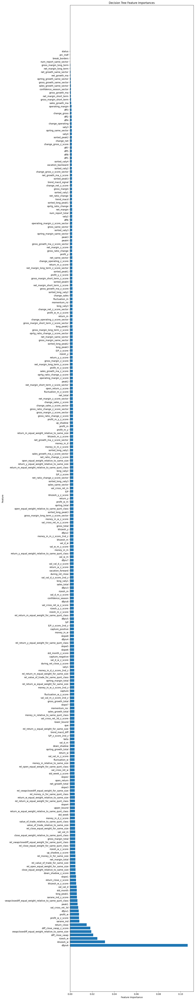

In [ ]:

# Get feature importance
dt_importance = tree.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': dt_importance
})

# Sort the DataFrame based on importance values
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Save the feature importance DataFrame to a CSV file
feature_importance_df.to_csv('feature_importance_dt.csv', index=False)

# Plot Decision Tree Feature Importances
plt.figure(figsize=(10, 80))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], align='center')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Decision Tree Feature Importances')
plt.show()

In [ ]:
feature_importance_df.head()

,Feature,Importance
39,dfpiv6,0.106470
60,khizesh_w,0.031589
59,rizesh_w,0.024691
54,diff_close_vwap,0.020939
207,vwapclosediff_equal_weight_relative_to_same_size,0.019252


## Random Forest Regression

In [ ]:
from sklearn.ensemble import RandomForestRegressor


# Instantiate the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Predictions
rf_y_pred = rf.predict(X_test)

In [ ]:
# Evaluate the model
rf_mse, rf_mae, rf_r2 = Evaluate_model("RandomForestRegressor ",y_test, rf_y_pred,)

RandomForestRegressor  Model Evaluate:
Mean Squared Error: 0.0006301900402195904
Mean absolute error: 0.01955287149139759
R^2 Score: 0.19728908837531756


RandomForestRegressor  Model Evaluate:

Mean Squared Error: 0.000630

Mean absolute error: 0.01955

R^2 Score: 0.197289

model shows decent predictive performance, with a low MSE and MAE. The relatively small errors indicate that the model makes accurate predictions on average.
The R^2 score of 0.197 suggests that the model is explaining about 20% of the variance in the target variable, which is modest. This implies that while the model does capture some patterns in the data, there are likely other factors or complexity in the data that the model is not fully capturing.

**ATTENTION:**
it was a time consuming model!!



##  XGBoost Regression

In [ ]:
import xgboost as xgb

# Instantiate the model
xg_reg = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)

# Train the model
xg_reg.fit(X_train, y_train)

# Predictions
xg_y_pred = xg_reg.predict(X_test)

In [ ]:
# Evaluate the model
xg_mse, xg_mae, xg_r2 = Evaluate_model("XGBRegressor ",y_test, xg_y_pred,)

XGBRegressor  Model Evaluate:
Mean Squared Error: 0.0006701967745708191
Mean absolute error: 0.020133701536943063
R^2 Score: 0.1463301075081952


XGBRegressor  Model Evaluate:

Mean Squared Error: 0.0006701

Mean absolute error: 0.020133

R^2 Score: 0.1463301

 the MSE and MAE values are relatively low, indicating that the predictions are numerically close to the actual outcomes, the R^2 score reveals a significant limitation in the model's ability to capture the data's variance. This suggests that there may be significant room for improvement, possibly through feature engineering, algorithm tuning, or exploring additional models.



## LightGBM Regression

In [ ]:
import lightgbm as lgb

# Instantiate the model
lgb_reg = lgb.LGBMRegressor(n_estimators=100, random_state=42)

# Train the model
lgb_reg.fit(X_train, y_train)

# Predictions
lgb_y_pred = lgb_reg.predict(X_test)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.998849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 61731
[LightGBM] [Info] Number of data points in the train set: 315823, number of used features: 260
[LightGBM] [Info] Start training from score 0.002273


In [ ]:
# Evaluate the model
lgb_mse, lgb_mae, lgb_r2 = Evaluate_model("LightGBM Regression ",y_test, lgb_y_pred,)

LightGBM Regression  Model Evaluate:
Mean Squared Error: 0.0006324977869159821
Mean absolute error: 0.019582298961475352
R^2 Score: 0.1943495727748903


LightGBM Regression  Model Evaluate:

Mean Squared Error: 0.0006324

Mean absolute error: 0.019582

R^2 Score: 0.194349

The Mean Squared Error  of 0.000632 indicates that the LightGBM model's predictions are close to the actual values on average, though not perfect. The Mean Absolute Error of 0.0196 reflects an average prediction error of about 0.02 units. The R^2 score of approximately 0.19 signifies that the model explains about 19.4% of the variance in the target variable, suggesting it has some predictive ability but still has significant room for enhancement. Overall, the model performs reasonably well, but further optimization and feature exploration could improve its effectiveness.

## CatBoost Regression

In [ ]:
# try to import catboost and if the lib doesn't exist, install and import it
try:
  import catboost

except:
  !pip install catboost
  import catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.4 MB/s eta 0:00:00


In [ ]:


# Instantiate the model
cat_reg = catboost.CatBoostRegressor(iterations=100, learning_rate=0.1, depth=6, random_state=42)

# Train the model
cat_reg.fit(X_train, y_train)

# Predictions
cat_reg_y_pred = cat_reg.predict(X_test)

0:	learn: 0.0294870	total: 758ms	remaining: 1m 15s
1:	learn: 0.0290954	total: 1.46s	remaining: 1m 11s
2:	learn: 0.0287556	total: 2.2s	remaining: 1m 11s
3:	learn: 0.0284508	total: 2.88s	remaining: 1m 9s
4:	learn: 0.0281986	total: 3.63s	remaining: 1m 8s
5:	learn: 0.0279951	total: 4.08s	remaining: 1m 3s
6:	learn: 0.0278186	total: 4.49s	remaining: 59.6s
7:	learn: 0.0276657	total: 4.9s	remaining: 56.4s
8:	learn: 0.0275269	total: 5.29s	remaining: 53.5s
9:	learn: 0.0274069	total: 5.67s	remaining: 51s
10:	learn: 0.0272989	total: 6.1s	remaining: 49.4s
11:	learn: 0.0272039	total: 6.5s	remaining: 47.7s
12:	learn: 0.0271289	total: 6.89s	remaining: 46.1s
13:	learn: 0.0270583	total: 7.27s	remaining: 44.6s
14:	learn: 0.0269962	total: 7.64s	remaining: 43.3s
15:	learn: 0.0269384	total: 8s	remaining: 42s
16:	learn: 0.0268900	total: 8.35s	remaining: 40.8s
17:	learn: 0.0268436	total: 8.71s	remaining: 39.7s
18:	learn: 0.0268033	total: 9.1s	remaining: 38.8s
19:	learn: 0.0267634	total: 9.47s	remaining: 37.9s

In [ ]:
# Evaluate the model
cat_reg_mse, cat_reg_mae, cat_reg_r2 = Evaluate_model("CatBoost Regression ",y_test, cat_reg_y_pred)

CatBoost Regression  Model Evaluate:
Mean Squared Error: 0.000628785694765785
Mean absolute error: 0.01955034734770805
R^2 Score: 0.19907788754305333


CatBoost Regression  Model Evaluate:

Mean Squared Error: 0.0006287

Mean absolute error: 0.019550

R^2 Score: 0.199077


The Mean Squared Error of 0.000628 indicates the model's predictions are very close to actual values. The Mean Absolute Error of 0.020 suggests that, on average, predictions deviate by about 0.02 units. The R^2 score of approximately 0.20 shows that the model explains about 19.9% of the variability in the target variable, indicating moderate predictive power but also room for improvement.


## Gradient Boosting Regression



In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Instantiate the model
gb = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Train the model
gb.fit(X_train, y_train)

# Predictions
gb_y_pred = gb.predict(X_test)

In [ ]:
# Evaluate the model
gb_reg_mse, gb_reg_mae, gb_reg_r2 = Evaluate_model("Gradient Boosting Regression ",y_test, gb_y_pred)

Gradient Boosting Regression  Model Evaluate:
Mean Squared Error: 0.0006319649017844406
Mean absolute error: 0.019605362794583865
R^2 Score: 0.19502834057893548


Gradient Boosting Regression  Model Evaluate:

Mean Squared Error: 0.0006319

Mean absolute error: 0.019605

R^2 Score: 0.195028

The Mean Squared Error (MSE) of 0.000632 indicates that the Gradient Boosting model's predictions are close to the actual values, while the Mean Absolute Error (MAE) of approximately 0.0196 suggests an average deviation of about 0.02 units from the true values. The R^2 score of roughly 0.195 implies that the model accounts for about 19.5% of the variability in the target variable, indicating moderate predictive performance with potential for improvement

# Choosing the model

TPOT (Tree-Based Pipeline Optimization Tool) is an automated machine learning library in Python that uses genetic programming to optimize machine learning pipelines. By evaluating combinations of preprocessing steps, feature selection methods, and algorithms, it identifies the best-performing pipeline. After running TPOT to streamline model selection, I chose XGBoost for further hyperparameter tuning due to **its superior performance in terms of both accuracy and time efficiency during evaluation**. XGBoost's scalability and ability to handle various data complexities make it the optimal choice for this project.
- main reason was time efficiency!!

## TPOT

In [ ]:
! pip install tpot

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.4/87.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 5.4 MB/s eta 0:00:00
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11938 sha256=4f7bad94cacdaaf8b4ac34bcd78e643a0cd90ebcae23c8b0c525c66b6b3b291a
  Stored in directory: /root/.cache/pip/wheels/af/f9/87/bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit


In [ ]:
from tpot import TPOTRegressor



# Define custom configuration dictionary with specified models
custom_config = {
    'sklearn.linear_model.LinearRegression': {},
    'sklearn.linear_model.Ridge': {},
    'sklearn.linear_model.Lasso': {},
    'sklearn.linear_model.ElasticNet': {},
    'sklearn.tree.DecisionTreeRegressor': {},
    'sklearn.ensemble.RandomForestRegressor': {},
    'sklearn.ensemble.ExtraTreesRegressor': {},
    'xgboost.XGBRegressor': {}
}

# Create TPOTRegressor instance
tpot = TPOTRegressor(
    generations=5,
    population_size=20,
    random_state=42,
    config_dict=custom_config,
    verbosity=2,
)



# Fit TPOT model
tpot.fit(X_train, y_train)

# Evaluate the best model on the test set
score = tpot.score(X_test, y_test)
print(f'Test Score: {score}')

# Export the best model pipeline
tpot.export('best_model_pipeline.py')
tpot.export('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/best_pipeline.py')

Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]

Exception ignored on calling ctypes callback function: <bound method DataIter._next_wrapper of <xgboost.data.SingleBatchInternalIter object at 0x79c9983e7d60>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/xgboost/core.py", line 582, in _next_wrapper
    def _next_wrapper(self, this: None) -> int:  # pylint: disable=unused-argument
stopit.utils.TimeoutException: 



Generation 1 - Current best internal CV score: -0.0007155758658697658


Exception ignored on calling ctypes callback function: <bound method DataIter._next_wrapper of <xgboost.data.SingleBatchInternalIter object at 0x79c97f6ed390>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/xgboost/core.py", line 582, in _next_wrapper
    def _next_wrapper(self, this: None) -> int:  # pylint: disable=unused-argument
stopit.utils.TimeoutException: 



Generation 2 - Current best internal CV score: -0.0007155758658697658

Generation 3 - Current best internal CV score: -0.0007155758658697658

Generation 4 - Current best internal CV score: -0.0007155758658697658

Generation 5 - Current best internal CV score: -0.0007155758658697658

Best pipeline: XGBRegressor(input_matrix)
Test Score: -0.0006701967745708191




---


**Output of TPOT**

```
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data = pd.read_csv('PATH/TO/DATA/FILE', sep='COLUMN_SEPARATOR', dtype=np.float64)
features = tpot_data.drop('target', axis=1)
training_features, testing_features, training_target, testing_target = \
            train_test_split(features, tpot_data['target'], random_state=42)


exported_pipeline = XGBRegressor()
# Fix random state in exported estimator
if hasattr(exported_pipeline, 'random_state'):
    setattr(exported_pipeline, 'random_state', 42)

exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

```



---



# Hyperparameter tuning

Hyperparameter tuning is a crucial step to optimize the performance of an XGBoost model for regression tasks.

Here are the steps to be followed for hyperparameter tuning:


1.  **Identify Hyperparameters for Tuning:**

* Learning Rate (eta): Controls how much the model weights each iteration.
* Number of Trees (n_estimators): The number of boosting rounds; too many may overfit, while too few may underfit.

* Maximum Depth (max_depth): Determines the depth of each tree.
* Column Subsampling (colsample_bytree, colsample_bylevel, colsample_bynode): Proportion of features used per tree or node.
* Regularization Parameters (lambda, alpha): L2 and L1 regularization terms to avoid overfitting.
* Minimum Child Weight (min_child_weight): Minimum sum of instance weight (hessian) needed in a child; helps control overfitting.
* Gamma: Minimum loss reduction required to make a further partition; can help regularize the model.
* Booster Type (booster): Can be either 'gbtree', 'gblinear', or 'dart' — select based on the problem complexity.
* Regularization Parameters (lambda, alpha):
lambda (L2 regularization) and alpha (L1 regularization) help to control overfitting by penalizing large coefficients.

2. **Hyperparameter Tuning Methods**
* Grid Search
* Randomized Search
* Automated Machine Learning (AutoML) Tools Like Mlflow

**In this project, I chose to use MLflow.**

## Mlflow

MLflow is a robust platform for managing machine learning workflows, including hyperparameter tuning for XGBoost. It provides tools for tracking experiments, storing parameters, metrics, and models, and managing deployment pipelines. For XGBoost, you can log hyperparameters such as learning rate, max depth, and number of estimators, alongside performance metrics like accuracy or RMSE. MLflow's tracking server enables easy comparison of different runs, helping identify the optimal hyperparameter combination. Once the best configuration is identified, the model and its parameters can be logged and packaged for deployment.

In [ ]:
!pip install mlflow optuna pyngrok

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.4/571.4 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.2/203.2 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.1 MB/s eta 0:00:00


In [ ]:
from pyngrok import ngrok # for tracking mlflow ui

# Set your ngrok auth token
ngrok.set_auth_token("2ospHhwI6NnXxnAG1sP0DURheZA_2zALD4nveqLRLuWDnrie2")

In [ ]:
import mlflow
import subprocess
from pyngrok import ngrok
import os

# Set up the directory to store the MLflow logs
mlflow_dir = "/content/mlruns"
os.makedirs(mlflow_dir, exist_ok=True)

# Start MLflow UI server in the background
mlflow.set_tracking_uri(f"file://{mlflow_dir}")
subprocess.Popen(["mlflow", "ui", "--host", "0.0.0.0", "--port", "5000"])

# Use ngrok to tunnel the local server to a public URL
public_url = ngrok.connect(5000)
print(f"MLflow UI is running at: {public_url}")


In [ ]:
import mlflow
import optuna
import xgboost as xgb
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
from mlflow import log_metric, log_param

# # Create or set the experiment name
# mlflow.set_experiment('optuna_xgboost_experiment') # if there was error about id 0 uncomment this line

# 2. Define the objective function for Optuna
def objective(trial):

    # Define different objective functions to try
    objectives = ['reg:squarederror', 'reg:squaredlogerror', 'reg:pseudohubererror']

    # Define the hyperparameter search space for XGBoost
    param = {
        'objective': trial.suggest_categorical('objective', objectives),
        'booster': 'gbtree',  # Use tree-based boosting
        'eval_metric': 'rmse',  # Evaluation metric: Root Mean Squared Error (RMSE)
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),  # Number of trees
        'max_depth': trial.suggest_int('max_depth', 3, 50),  # Maximum depth of the tree
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),  # Learning rate
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),  # Fraction of samples used for training
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),  # Fraction of features
        'gamma': trial.suggest_float('gamma', 0, 5),  # Minimum loss reduction for further partitioning
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),  # Minimum sum of instance weight for a child
        'alpha': trial.suggest_float('alpha', 0, 1),  # L1 regularization (Lasso)
        'lambda': trial.suggest_float('lambda', 0, 1),  # L2 regularization (Ridge)
    }

    # Create and train the XGBoost model
    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train)

    # Make predictions and compute evaluation metrics
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Log hyperparameters and metrics using MLflow
    with mlflow.start_run():
        mlflow.log_params(param)
        mlflow.log_metric('rmse', rmse)
        mlflow.log_metric('r2', r2)
        mlflow.xgboost.log_model(model, "model")

    # Return the RMSE (as we want to minimize it)
    return rmse

# Set up and run the Optuna optimization study
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials= 50)

# Print out the best hyperparameters and performance
print("Best hyperparameters found: ", study.best_params)
print("Best RMSE: ", study.best_value)



[I 2024-11-14 18:52:06,684] A new study created in memory with name: no-name-165f6ebf-6359-4ebc-b6b1-a7596846626c
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [18:53:44] WARNING: /workspace/src/c_api/c_api.cc:1374: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  warnings.warn(smsg, UserWarning)
2024/11/14 18:53:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2024-11-14 18:53:50,983] Trial 0 finished with value: 0.026754302203856488 and parameters: {'objective': 'reg:pseudohubererror', 'n_estimators': 495, 'max_depth': 12, 'learning_rate': 0.04331165252473959, 'subsample': 0.6920626074366484, 'colsample_bytree': 0.8106782379667236, 'gamma': 4.629370793970164, 'min_child_weight': 5, 'alpha': 0.4598472249263704, 'lambda': 0.9613089614570165}. B

Best hyperparameters found:  {'objective': 'reg:squarederror', 'n_estimators': 88, 'max_depth': 40, 'learning_rate': 0.029869758813320338, 'subsample': 0.7960505841159938, 'colsample_bytree': 0.9012499107992313, 'gamma': 0.006415004522138307, 'min_child_weight': 5, 'alpha': 0.6703059910481342, 'lambda': 0.272981772562213}
Best RMSE:  0.024923572607892495


In [ ]:
# Print the best parameters and objective
print("Best trial:")
trial = study.best_trial
print(f"Value: {trial.value}")
print("Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")



Best trial:
Value: 0.024923572607892495
Params: 
    objective: reg:squarederror
    n_estimators: 88
    max_depth: 40
    learning_rate: 0.029869758813320338
    subsample: 0.7960505841159938
    colsample_bytree: 0.9012499107992313
    gamma: 0.006415004522138307
    min_child_weight: 5
    alpha: 0.6703059910481342
    lambda: 0.272981772562213


In [ ]:
import pickle

params = dict(trial.params.items())

# Save parameters to a file
with open('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/model_params.pkl', 'wb') as f:
    pickle.dump(params, f)

# Load parameters from the file
with open('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/model_params.pkl', 'rb') as f:
    loaded_params = pickle.load(f)

print(loaded_params)


{'objective': 'reg:squarederror', 'n_estimators': 88, 'max_depth': 40, 'learning_rate': 0.029869758813320338, 'subsample': 0.7960505841159938, 'colsample_bytree': 0.9012499107992313, 'gamma': 0.006415004522138307, 'min_child_weight': 5, 'alpha': 0.6703059910481342, 'lambda': 0.272981772562213}


In [ ]:
import xgboost as xgb

# Initialize the XGBoost model
model = xgb.XGBRegressor(**loaded_params)

# Train the model
model.fit(X_train, y_train)


XGBRegressor(alpha=0.6703059910481342, base_score=None, booster=None,
             callbacks=None, colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9012499107992313, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.006415004522138307,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.272981772562213,
             learning_rate=0.029869758813320338, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=40, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=88, n_jobs=None, ...)

In [ ]:
# Predictions
mlflow_best_xg_y_pred = model.predict(X_test)
# Evaluate the model
mlflow_best_xg_mse, mlflow_best__xg_mae, mlflow_best__xg_r2 = Evaluate_model("mlflow_best_XGBRegressor ",y_test, mlflow_best_xg_y_pred)

mlflow_best_XGBRegressor  Model Evaluate:
Mean Squared Error: 0.000621184471540889
Mean absolute error: 0.019309745401488873
R^2 Score: 0.208760022192774


In [ ]:
# Save as a binary file
np.save('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/mlflow_best_xg_y_pred.npy', mlflow_best_xg_y_pred)

# Load the binary file
mlflow_best_xg_y_pred_loaded = np.load('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/mlflow_best_xg_y_pred.npy')

mlflow_best_xg_y_pred_loaded

array([-0.00850648,  0.00538425, -0.00292643, ..., -0.00809461,
       -0.00442477,  0.01659411], dtype=float32)

# Visualizing Daily Return Values for Each Group of the XGBOOST:

## Prepare data

In [ ]:
# Concatenate y_test with the prediction array
y_test_with_pred = pd.concat([y_test, pd.Series(mlflow_best_xg_y_pred_loaded, index=y_test.index, name='prediction')], axis=1)

y_test_with_pred.head()

## Visualize and explaination:

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def visualize_returns_by_quantile(df):
    unique_dates = df.index.get_level_values('date').unique()
    n_dates = len(unique_dates)

    # Calculate the number of rows and columns needed for the subplots
    n_cols = 3
    n_rows = int(np.ceil(n_dates / n_cols))

    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    for i, date in enumerate(unique_dates):
        daily_df = df.loc[date]
        daily_df['quantile'] = pd.qcut(daily_df['prediction'], 5, labels=False)
        returns_by_quantile = daily_df.groupby('quantile')['ret_abs_1_days'].mean()

        ax = axes[i]
        ax.bar(returns_by_quantile.index, returns_by_quantile.values)
        ax.set_xlabel("Quantile Group (Prediction)")
        ax.set_ylabel("Average Return")
        ax.set_title(f"Average Return by Prediction Quantile ({date})")
        ax.set_xticks(returns_by_quantile.index)

    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [ ]:
# usage:
visualize_returns_by_quantile(y_test_with_pred)


<ipython-input-30-5bf56e65e38b>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_df['quantile'] = pd.qcut(daily_df['prediction'], 5, labels=False)
<ipython-input-30-5bf56e65e38b>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_df['quantile'] = pd.qcut(daily_df['prediction'], 5, labels=False)
<ipython-input-30-5bf56e65e38b>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

## Feature metrics

### shapley

100%|===================| 315811/315823 [184:23<00:00]       

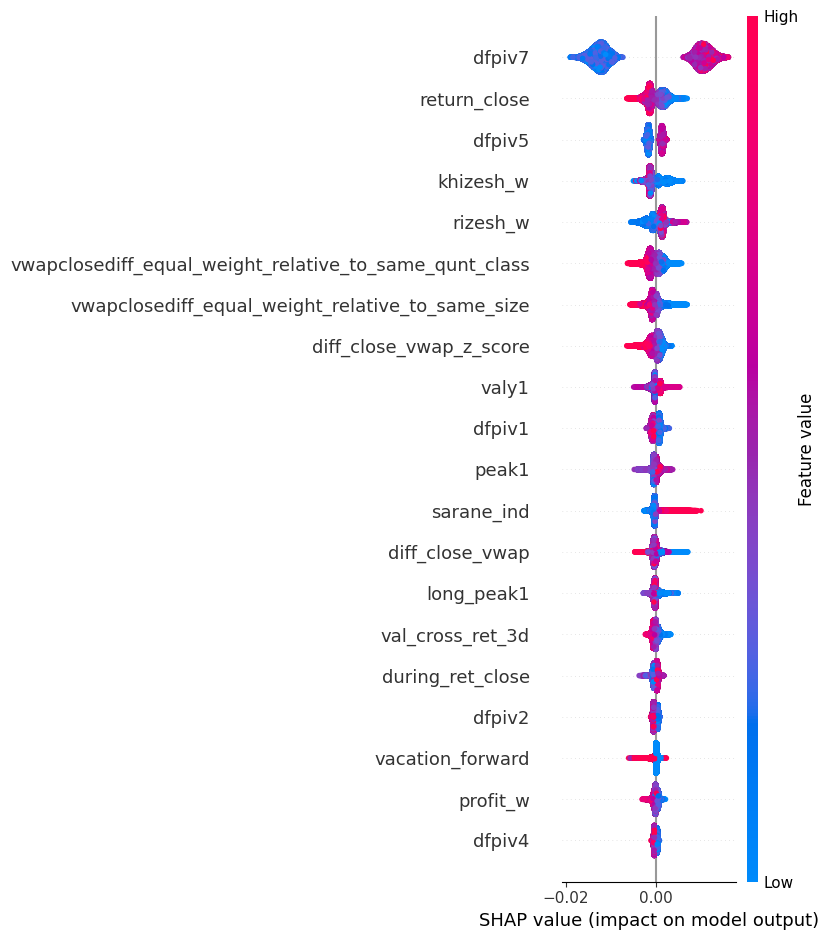

Feature Importance based on SHAP values:
                    Feature  SHAP Importance
38                   dfpiv7     1.158071e-02
53             return_close     1.671600e-03
40                   dfpiv5     1.571025e-03
60                khizesh_w     1.534286e-03
59                 rizesh_w     1.399560e-03
..                      ...              ...
119    net_margin_long_term     4.465645e-07
102           break_borders     3.726805e-07
95                  prc_mdf     7.155125e-08
120  gross_margin_long_term     6.946434e-08
0                    status     0.000000e+00

[261 rows x 2 columns]


NameError: name 'df' is not defined

In [ ]:
import shap


# Create SHAP explainer
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_train)

# Visualize the SHAP summary plot for feature importance
shap.summary_plot(shap_values, X_train)


# Analyze SHAP values to select top N features
# Calculate mean absolute SHAP values per feature
feature_importance = np.abs(shap_values.values).mean(axis=0)
feature_names = X_train.columns


# Create a DataFrame for better readability
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'SHAP Importance': feature_importance
})


# Sort by SHAP importance
feature_importance_df = feature_importance_df.sort_values(by='SHAP Importance', ascending=False)


print("Feature Importance based on SHAP values:")
print(feature_importance_df)

# save it in a drive

feature_importance_df.to_csv('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/feature_importance.csv', index=False)


In [ ]:
# load_feature_importance data
feature_importance_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/feature_importance.csv')
feature_importance_df.head()

,Feature,SHAP Importance
0,dfpiv7,0.011581
1,return_close,0.001672
2,dfpiv5,0.001571
3,khizesh_w,0.001534
4,rizesh_w,0.001400


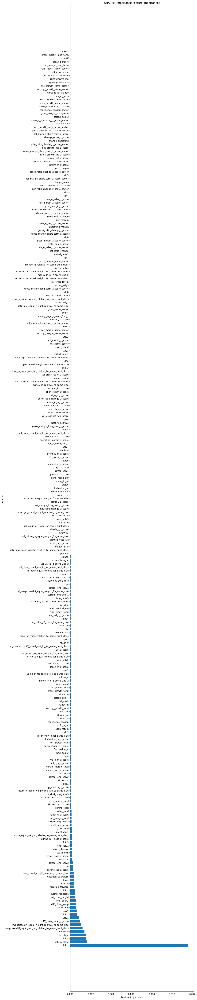

In [ ]:
# Plot shap Feature Importances
plt.figure(figsize=(10, 80))
plt.barh(feature_importance_df['Feature'], feature_importance_df['SHAP Importance'], align='center')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('SHAPELY Importance Feature Importances')
plt.show()

### Reduce number of features by shap feature metrics

In [15]:
# load feature_importance_df
feature_importance_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/feature_importance.csv')
print(feature_importance_df.head())

        Feature  SHAP Importance
0        dfpiv7         0.011581
1  return_close         0.001672
2        dfpiv5         0.001571
3     khizesh_w         0.001534
4      rizesh_w         0.001400


In [16]:
# Select top N features for further model training
top_n_features = feature_importance_df.head(100)['Feature'].values  # Select top 100 features based on SHAP
print(f"Top N features selected based on SHAP: {top_n_features}")

Top N features selected based on SHAP: ['dfpiv7' 'return_close' 'dfpiv5' 'khizesh_w' 'rizesh_w'
 'vwapclosediff_equal_weight_relative_to_same_qunt_class'
 'vwapclosediff_equal_weight_relative_to_same_size'
 'diff_close_vwap_z_score' 'valy1' 'dfpiv1' 'peak1' 'sarane_ind'
 'diff_close_vwap' 'long_peak1' 'val_cross_ret_3d' 'during_ret_close'
 'dfpiv2' 'vacation_forward' 'profit_w' 'dfpiv4' 'vacation_backward'
 'close_equal_weight_relative_to_same_size' 'sarane_ind_z_score' 'que'
 'sorted_long_valy3' 'val_val_d' 'return_close_z_score' 'std_month'
 'down_shadow' 'long_valy1' 'dfpiv3' 'during_ret_close_z_score'
 'close_equal_weight_relative_to_same_qunt_class' 'up_shadow'
 'gross_total' 'profit_w_z_score' 'sorted_long_peak2' 'net_margin_total'
 'rizesh_w_z_score' 'sales_total' 'oprtng_total' 'khizesh_w_z_score'
 'gross_margin_total' 'val_cross_ret_3d_z_score' 'sorted_long_peak3'
 'return_w_equal_weight_relative_to_same_size' 'up_shadow_z_score'
 'slope1' 'khizesh_y' 'sorted_long_valy2' 'net_



---

### Test the model on selected_X_train

In this section, I applied my best-performing XGBoost regression model, which was previously optimized, to the newly selected features to evaluate its performance. However, since model parameters are highly dependent on the specific data and features, I conducted another round of hyperparameter tuning tailored to the selected feature set in the subsequent section.

In [ ]:

# drop unimportant features
X_train_selected = X_train.loc[:, top_n_features]
X_test_selected = X_test.loc[:, top_n_features]


# Define the model parameters
params = {
    'objective': 'reg:squarederror',
    'n_estimators': 88,
    'max_depth': 40,
    'learning_rate': 0.029869758813320338,
    'subsample': 0.7960505841159938,
    'colsample_bytree': 0.9012499107992313,
    'gamma': 0.006415004522138307,
    'min_child_weight': 5,
    'alpha': 0.6703059910481342,
    'lambda': 0.272981772562213,
}

# Retrain the model using only the selected features
xg_model_selected = xgb.XGBRegressor(**params)

# Train the model
xg_model_selected.fit(X_train_selected, y_train)


# Evaluate the retrained model on the test data
y_pred_selected = xg_model_selected.predict(X_test_selected)


In [ ]:
# # Evaluate the model
selected_mse, selected_mae, selected_r2 =  Evaluate_model("Xgboost on selected feature",y_test, y_pred_selected)

Xgboost on selected feature Model Evaluate:
Mean Squared Error: 0.0006209638679750962
Mean absolute error: 0.019313607764001352
R^2 Score: 0.20904101820683918




---

### Hyper parameter tuning on selected_X_train
  After selecting the most relevant features, I conducted hyperparameter tuning on the selected_X_train dataset to optimize the performance of the XGBoost regression model. Hyperparameter tuning is essential at this stage because the feature selection process alters the input data's structure and relationships. As a result, the previously tuned hyperparameters may no longer yield optimal performance.

In [ ]:
import mlflow
import optuna
import xgboost as xgb
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
from mlflow import log_metric, log_param

# # Create or set the experiment name
# mlflow.set_experiment('optuna_xgboost_experiment') # if there was error about id 0 uncomment this line

# 2. Define the objective function for Optuna
def objective(trial):

    # Define different objective functions to try
    objectives = ['reg:squarederror', 'reg:squaredlogerror', 'reg:pseudohubererror']

    # Define the hyperparameter search space for XGBoost
    param = {
        'objective': trial.suggest_categorical('objective', objectives),
        'booster': 'gbtree',  # Use tree-based boosting
        'eval_metric': 'rmse',  # Evaluation metric: Root Mean Squared Error (RMSE)
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),  # Number of trees
        'max_depth': trial.suggest_int('max_depth', 3, 50),  # Maximum depth of the tree
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),  # Learning rate
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),  # Fraction of samples used for training
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),  # Fraction of features
        'gamma': trial.suggest_float('gamma', 0, 5),  # Minimum loss reduction for further partitioning
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),  # Minimum sum of instance weight for a child
        'alpha': trial.suggest_float('alpha', 0, 1),  # L1 regularization (Lasso)
        'lambda': trial.suggest_float('lambda', 0, 1),  # L2 regularization (Ridge)
    }

    # Create and train the XGBoost model
    model = xgb.XGBRegressor(**param)
    model.fit(X_train_selected, y_train)

    # Make predictions and compute evaluation metrics
    y_pred = model.predict(X_test_selected)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Log hyperparameters and metrics using MLflow
    with mlflow.start_run():
        mlflow.log_params(param)
        mlflow.log_metric('rmse', rmse)
        mlflow.log_metric('r2', r2)
        mlflow.xgboost.log_model(model, "model")

    # Return the RMSE (as we want to minimize it)
    return rmse

# Set up and run the Optuna optimization study
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials= 30)

# Print out the best hyperparameters and performance
print("Best hyperparameters found: ", study.best_params)
print("Best RMSE: ", study.best_value)



[I 2024-11-17 14:25:49,599] A new study created in memory with name: no-name-a985745b-f712-46d7-9b73-f8833215f740
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [14:26:06] WARNING: /workspace/src/c_api/c_api.cc:1374: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  warnings.warn(smsg, UserWarning)
2024/11/17 14:26:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2024-11-17 14:26:15,281] Trial 0 finished with value: 0.026493545870686742 and parameters: {'objective': 'reg:pseudohubererror', 'n_estimators': 171, 'max_depth': 28, 'learning_rate': 0.04073958087535942, 'subsample': 0.8401626265636083, 'colsample_bytree': 0.8938860771993273, 'gamma': 3.3223364033572844, 'min_child_weight': 1, 'alpha': 0.570105112607575, 'lambda': 0.876673389541531}. Be

Best hyperparameters found:  {'objective': 'reg:squarederror', 'n_estimators': 392, 'max_depth': 39, 'learning_rate': 0.059696405490556284, 'subsample': 0.61048996978782, 'colsample_bytree': 0.774513020588034, 'gamma': 0.011259274674460924, 'min_child_weight': 6, 'alpha': 0.6992068486644603, 'lambda': 0.05734691015655635}
Best RMSE:  0.024886551560238737


In [ ]:
# Print the best parameters and objective
print("Best trial:")
trial = study.best_trial
print(f"Value: {trial.value}")
print("Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

Best trial:
Value: 0.024886551560238737
Params: 
    objective: reg:squarederror
    n_estimators: 392
    max_depth: 39
    learning_rate: 0.059696405490556284
    subsample: 0.61048996978782
    colsample_bytree: 0.774513020588034
    gamma: 0.011259274674460924
    min_child_weight: 6
    alpha: 0.6992068486644603
    lambda: 0.05734691015655635


In [ ]:
selected_params = dict(trial.params.items())

# Save parameters to a file
with open('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/model_params_selected.pkl', 'wb') as f:
    pickle.dump(selected_params, f)

# Load parameters from the file
with open('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/model_params_selected.pkl', 'rb') as f:
    loaded_params_selected = pickle.load(f)

print(loaded_params_selected)

{'objective': 'reg:squarederror', 'n_estimators': 392, 'max_depth': 39, 'learning_rate': 0.059696405490556284, 'subsample': 0.61048996978782, 'colsample_bytree': 0.774513020588034, 'gamma': 0.011259274674460924, 'min_child_weight': 6, 'alpha': 0.6992068486644603, 'lambda': 0.05734691015655635}


In [ ]:
# Retrain the model using only the selected features
xg_model_selected = xgb.XGBRegressor(**loaded_params_selected)

# Train the model
xg_model_selected.fit(X_train_selected, y_train)

XGBRegressor(alpha=0.6992068486644603, base_score=None, booster=None,
             callbacks=None, colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.774513020588034, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.011259274674460924,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.05734691015655635,
             learning_rate=0.059696405490556284, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=39, max_leaves=None,
             min_child_weight=6, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=392, n_jobs=None, ...)

In [ ]:
# Evaluate the retrained model on the test data
y_pred_selected = xg_model_selected.predict(X_test_selected)

# Evaluate the model
selected_mse, selected_mae, selected_r2 =  Evaluate_model("Xgboost on selected feature",y_test, y_pred_selected)

Xgboost on selected feature Model Evaluate:
Mean Squared Error: 0.0006193404485604211
Mean absolute error: 0.019366725340138183
R^2 Score: 0.2111088650389613


In [ ]:
# Save as a binary file
np.save('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/mlflow_best_xg_y_pred__selected.npy', y_pred_selected)

# Load the binary file
mlflow_best_xg_y_pred_selected_loaded = np.load('/content/drive/MyDrive/Colab Notebooks/pardazesh_aras/mlflow_best_xg_y_pred__selected.npy')

mlflow_best_xg_y_pred_selected_loaded

array([-0.00995142,  0.00829232, -0.00239064, ..., -0.0069159 ,
       -0.0055692 ,  0.02606165], dtype=float32)

### Visualizing Daily return values for Selected_X

In [ ]:
# Concatenate y_test with the prediction array
y_test_with_pred_selected = pd.concat([y_test, pd.Series(mlflow_best_xg_y_pred_selected_loaded, index=y_test.index, name='prediction_selected')], axis=1)

y_test_with_pred_selected.head()

In [ ]:
# usage:
visualize_returns_by_quantile(y_test_with_pred_selected)

<ipython-input-42-571b7d014702>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_df['quantile'] = pd.qcut(daily_df['prediction_selected'], 5, labels=False)
<ipython-input-42-571b7d014702>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_df['quantile'] = pd.qcut(daily_df['prediction_selected'], 5, labels=False)
<ipython-input-42-571b7d014702>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S